In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
client = pd.read_csv("../Berka Bank dataset/client.asc", sep=";")

account = pd.read_csv("../Berka Bank dataset/account.asc", sep=";")

disp = pd.read_csv("../Berka Bank dataset/disp.asc", sep=";")

trans = pd.read_csv(
    "../Berka Bank dataset/trans.asc",
    sep=";",
    low_memory=False
)

loan = pd.read_csv("../Berka Bank dataset/loan.asc", sep=";")

In [3]:
client.head()

,client_id,birth_number,district_id
0,1,706213,18
1,2,450204,1
2,3,406009,1
3,4,561201,5
4,5,605703,5


In [4]:
account.head()

,account_id,district_id,frequency,date
0,576,55,POPLATEK MESICNE,930101
1,3818,74,POPLATEK MESICNE,930101
2,704,55,POPLATEK MESICNE,930101
3,2378,16,POPLATEK MESICNE,930101
4,2632,24,POPLATEK MESICNE,930102


In [5]:
trans.head()

,trans_id,account_id,date,type,operation,amount,balance,k_symbol,bank,account
0,695247,2378,930101,PRIJEM,VKLAD,700.0,700.0,NaN,NaN,NaN
1,171812,576,930101,PRIJEM,VKLAD,900.0,900.0,NaN,NaN,NaN
2,207264,704,930101,PRIJEM,VKLAD,1000.0,1000.0,NaN,NaN,NaN
3,1117247,3818,930101,PRIJEM,VKLAD,600.0,600.0,NaN,NaN,NaN
4,579373,1972,930102,PRIJEM,VKLAD,400.0,400.0,NaN,NaN,NaN


In [6]:
loan.head()

,loan_id,account_id,date,amount,duration,payments,status
0,5314,1787,930705,96396,12,8033.0,B
1,5316,1801,930711,165960,36,4610.0,A
2,6863,9188,930728,127080,60,2118.0,A
3,5325,1843,930803,105804,36,2939.0,A
4,7240,11013,930906,274740,60,4579.0,A


In [7]:
client.dtypes

client_id       int64
birth_number    int64
district_id     int64
dtype: object

In [8]:
account.dtypes

account_id      int64
district_id     int64
frequency      object
date            int64
dtype: object

In [9]:
trans.dtypes

trans_id        int64
account_id      int64
date            int64
type           object
operation      object
amount        float64
balance       float64
k_symbol       object
bank           object
account       float64
dtype: object

In [10]:
loan.dtypes

loan_id         int64
account_id      int64
date            int64
amount          int64
duration        int64
payments      float64
status         object
dtype: object

In [11]:
len(client)

5369

In [13]:
len(account)

4500

In [12]:
len(trans)

1056320

In [14]:
len(loan)

682

In [15]:
client.shape

(5369, 3)

In [16]:
account.shape

(4500, 4)

In [17]:
trans.shape

(1056320, 10)

In [18]:
loan.shape

(682, 7)

In [19]:
account["date"] = pd.to_datetime(
    account["date"],
    format="%y%m%d"
)

In [20]:
trans["date"] = pd.to_datetime(
    trans["date"],
    format="%y%m%d"
)

In [21]:
loan["date"] = pd.to_datetime(
    loan["date"],
    format="%y%m%d"
)

In [22]:
client["gender"] = client["birth_number"].apply(
    lambda x: "F" if int(str(x)[2:4]) > 12 else "M"
)

In [23]:
df = disp.merge(client, on="client_id")

In [24]:
df = df.merge(account, on="account_id")

In [25]:
trans_agg = trans.groupby("account_id").agg({
    "amount": ["mean", "sum", "count"],
    "balance": "mean"
}).reset_index()

In [26]:
trans_agg.columns = [
    "account_id",
    "avg_amount",
    "total_amount",
    "num_trans",
    "avg_balance"
]

In [27]:
loan_small = loan[[
    "account_id",
    "amount",
    "duration",
    "payments",
    "status"
]]

In [28]:
df = df.merge(trans_agg, on="account_id", how="left")

In [29]:
df = df.merge(loan_small, on="account_id", how="left")

In [30]:
df = df.dropna(subset=["status"])

In [31]:
df["target"] = df["status"].apply(
    lambda x: 1 if x in ["A", "C"] else 0
)

In [32]:
df.head()

,disp_id,client_id,account_id,type,birth_number,district_id_x,gender,district_id_y,frequency,date,avg_amount,total_amount,num_trans,avg_balance,amount,duration,payments,status,target
1,2,2,2,OWNER,450204,1,M,1,POPLATEK MESICNE,1993-02-26,6593.052929,3151479.3,478,36540.704393,80952.0,24.0,3373.0,A,1
2,3,3,2,DISPONENT,406009,1,F,1,POPLATEK MESICNE,1993-02-26,6593.052929,3151479.3,478,36540.704393,80952.0,24.0,3373.0,A,1
24,25,25,19,OWNER,395423,21,F,21,POPLATEK MESICNE,1995-04-07,5199.722442,1575515.9,303,16253.069967,30276.0,12.0,2523.0,B,0
30,31,31,25,OWNER,620209,68,M,68,POPLATEK MESICNE,1996-07-28,10797.609854,2958545.1,274,56279.128467,30276.0,12.0,2523.0,A,1
42,45,45,37,OWNER,520826,20,M,20,POPLATEK MESICNE,1997-08-18,7293.491538,948153.9,130,37547.422308,318480.0,60.0,5308.0,D,0


In [33]:
df.dtypes

disp_id                   int64
client_id                 int64
account_id                int64
type                     object
birth_number              int64
district_id_x             int64
gender                   object
district_id_y             int64
frequency                object
date             datetime64[ns]
avg_amount              float64
total_amount            float64
num_trans                 int64
avg_balance             float64
amount                  float64
duration                float64
payments                float64
status                   object
target                    int64
dtype: object

In [34]:
df.describe(include="all")

,disp_id,client_id,account_id,type,birth_number,district_id_x,gender,district_id_y,frequency,date,avg_amount,total_amount,num_trans,avg_balance,amount,duration,payments,status,target
count,827.000000,827.000000,827.000000,827,827.000000,827.000000,827,827.000000,827,827,827.000000,8.270000e+02,827.000000,827.000000,827.000000,827.000000,827.000000,827,827.000000
unique,NaN,NaN,NaN,2,NaN,NaN,2,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN
top,NaN,NaN,NaN,OWNER,NaN,NaN,F,NaN,POPLATEK MESICNE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C,NaN
freq,NaN,NaN,NaN,682,NaN,NaN,417,NaN,680,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,493,NaN
mean,7049.634825,7171.419589,5863.874244,NaN,582148.870617,38.215236,NaN,37.621524,NaN,1995-08-21 14:39:19.371221248,8415.641999,2.327635e+06,282.499395,45007.633721,151801.538089,36.261185,4231.251511,NaN,0.908102
min,2.000000,2.000000,2.000000,NaN,341130.000000,1.000000,NaN,1.000000,NaN,1993-01-13 00:00:00,1315.574427,1.418696e+05,49.000000,6690.549848,4980.000000,12.000000,304.000000,NaN,0.000000
25%,3608.500000,3608.500000,2988.000000,NaN,470126.500000,14.000000,NaN,13.000000,NaN,1994-05-22 00:00:00,5377.361552,1.135261e+06,175.000000,34815.284879,67536.000000,24.000000,2495.500000,NaN,1.000000
50%,7011.000000,7011.000000,5794.000000,NaN,580821.000000,41.000000,NaN,39.000000,NaN,1996-01-26 00:00:00,8256.877094,2.020074e+06,253.000000,45595.754967,115992.000000,36.000000,3937.000000,NaN,1.000000
75%,10487.500000,10795.500000,8757.000000,NaN,688169.500000,60.000000,NaN,60.000000,NaN,1996-10-12 00:00:00,11327.699638,3.137644e+06,392.500000,55425.803382,210564.000000,48.000000,5916.000000,NaN,1.000000
max,13663.000000,13971.000000,11362.000000,NaN,851019.000000,77.000000,NaN,77.000000,NaN,1997-12-22 00:00:00,19772.444737,7.399358e+06,675.000000,79272.044980,590820.000000,60.000000,9910.000000,NaN,1.000000


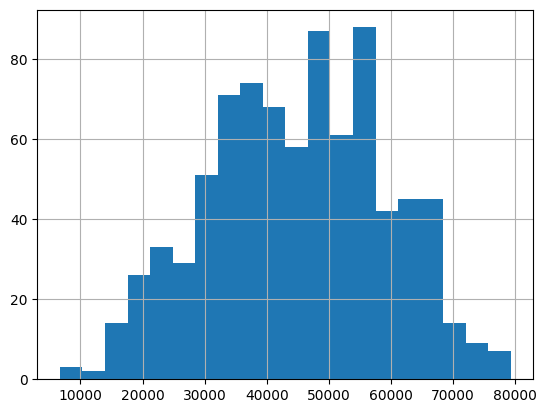

In [35]:
df["avg_balance"].hist(bins=20)
plt.show()

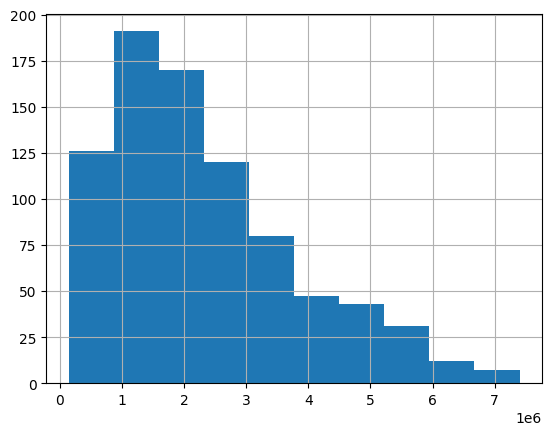

In [59]:
df["total_amount"].hist(bins=10)
plt.show()

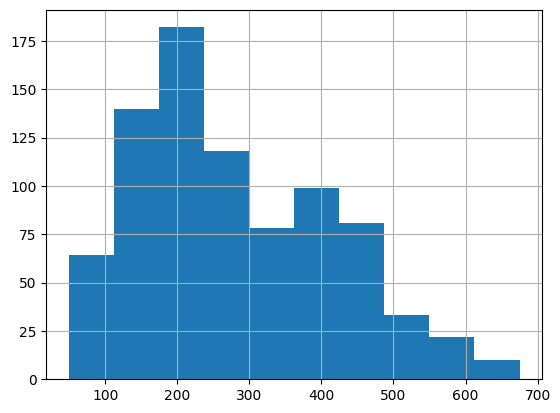

In [60]:
df["num_trans"].hist(bins=10)
plt.show()

In [37]:
df["avg_balance"].mean()

np.float64(45007.63372112425)

In [38]:
df["avg_balance"].median()

45595.75496688742

In [39]:
df["avg_balance"].mode()

0      17055.049533
1      17325.220000
2      17875.283043
3      17913.513265
4      18739.451075
           ...     
140    72794.256566
141    73383.993622
142    76110.075000
143    76453.607692
144    77371.238462
Name: avg_balance, Length: 145, dtype: float64

In [40]:
df["avg_balance"].var()

201399530.50423312

In [41]:
df["avg_balance"].std()

14191.530238287663

In [42]:
maximo = df["avg_balance"].max()

minimo = df["avg_balance"].min()

rango = maximo - minimo

rango

72581.49513189537

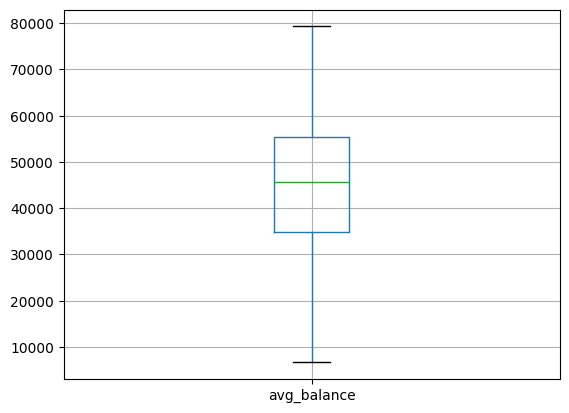

In [43]:
df.boxplot("avg_balance")
plt.show()

In [45]:
df["frequency"].value_counts()

frequency
POPLATEK MESICNE      680
POPLATEK TYDNE        107
POPLATEK PO OBRATU     40
Name: count, dtype: int64

In [46]:
df["status"].value_counts()

status
C    493
A    258
D     45
B     31
Name: count, dtype: int64

In [47]:
df["gender"].value_counts()

gender
F    417
M    410
Name: count, dtype: int64

In [ ]:
#Analisis Bivariado

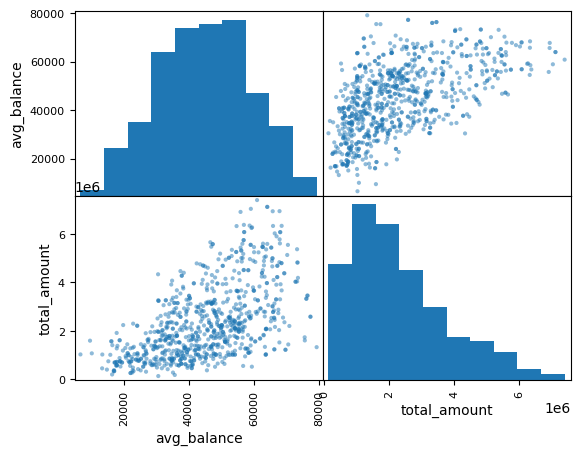

In [61]:
pd.plotting.scatter_matrix(
    df[[
        "avg_balance",
        "total_amount"
    ]],
    alpha=0.5
)

plt.show()

<Axes: xlabel='total_amount', ylabel='avg_balance'>

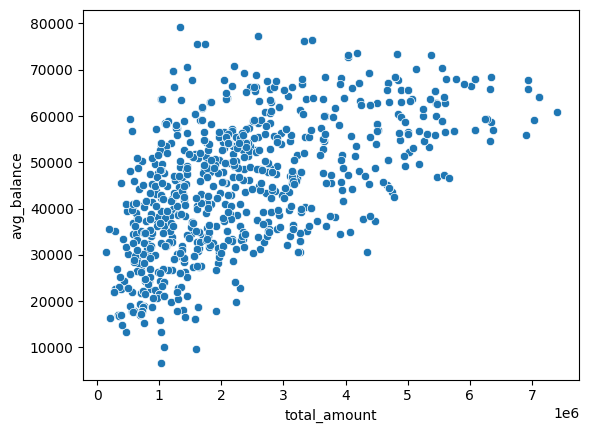

In [62]:
sns.scatterplot(
    data=df,
    x="total_amount",
    y="avg_balance"
)

In [50]:
corr_df = df[[
    "avg_balance",
    "total_amount",
    "num_trans",
    "payments",
    "amount",
    "target"
]].corr()

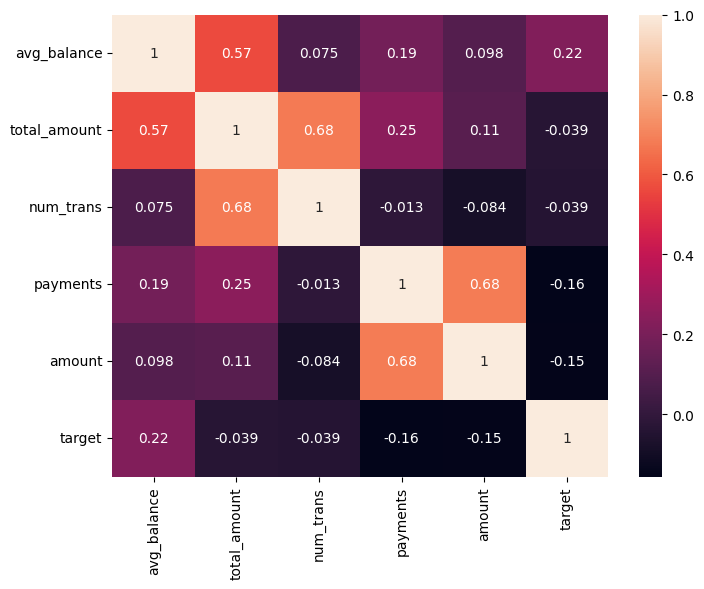

In [51]:
plt.figure(figsize=(8,6))

sns.heatmap(corr_df, annot=True)

plt.show()

In [63]:
df.groupby(["target"]).agg({
    "avg_balance":"mean",
    "total_amount":"mean",
    "num_trans":"mean",
    "payments":"mean",
    "amount":"mean"
}).sort_values(["target"], ascending=True)

,avg_balance,total_amount,num_trans,payments,amount
target,,,,,
0,35166.311823,2.509361e+06,299.473684,5331.355263,205002.000000
1,46003.559772,2.309245e+06,280.781625,4119.922770,146417.736352


In [53]:
df.groupby(["gender","target"]).agg({
    "avg_balance":"mean"
})

avg_balance
gender target              
F      0       36731.839135
       1       45398.856943
M      0       33332.408401
       1       46609.875142

In [54]:
!pip install ydata-profiling

Defaulting to user installation because normal site-packages is not writeable


In [56]:
from ydata_profiling import ProfileReport

In [57]:
profile = ProfileReport(
    df,
    title="Berka Profiling Report"
)

In [58]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 967.58it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]